In [84]:
import numpy as np
import pandas as pd
import imageio
import os
from copy import deepcopy

from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw
import scipy.ndimage as si

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.font_manager as font_manager
font_files = font_manager.findSystemFonts()
import seaborn as sns
%matplotlib inline

# Uncertainty quantification

## Exercise: Do semantic and instance uncertainty match with perceived quality?

In [129]:
image_id = 'maharashtra_0415'

img_dir = '../data/maharashtra/airbus_false_color_4096px/'
results_dir = '../data/maharashtra/fractal-resunet_Airbus_nfilter-32_depth-6_bs-5_lr-0.001_3x-downsampled-erosion2px_finetuned/'

img = imageio.imread(os.path.join(img_dir, '{}.png'.format(image_id)))
extent = imageio.imread(os.path.join(results_dir, 'extent_4096px/{}.png'.format(image_id)))
extent = np.array(extent, dtype=np.float32) / 255.
boundary = imageio.imread(os.path.join(results_dir, 'boundary_4096px/{}.png'.format(image_id)))
boundary = np.array(boundary, dtype=np.float32) / 255.
instances = np.load(os.path.join(results_dir, 'instances_4096px/{}.npy'.format(image_id)))

In [130]:
# sample 10 points randomly
n_points = 10
img_size = 4096
xs = np.random.choice(np.arange(img_size), n_points)
ys = np.random.choice(np.arange(img_size), n_points)
points = np.array([xs, ys]).T

font = ImageFont.truetype('/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf', 50)
img = Image.open(os.path.join(img_dir, '{}.png'.format(image_id)))
draw = ImageDraw.Draw(img)

for i, (x, y) in enumerate(points):
    draw.text((y+20, x+20), "{}".format(i), (255, 70, 70), font=font)
    
dot_size = 5
img = np.array(img)
for i, (x, y) in enumerate(points):
    img[x-dot_size:x+dot_size,y-dot_size:y+dot_size] = [255, 70, 70]

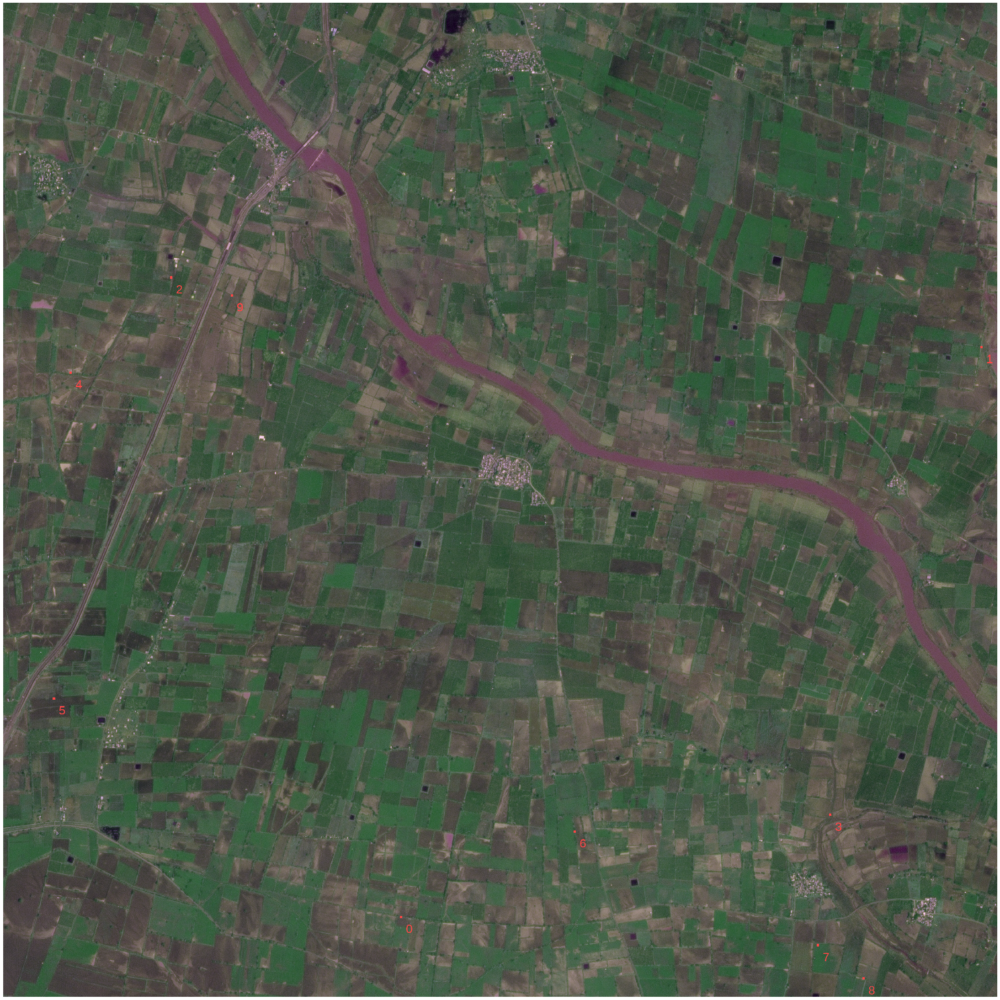

In [131]:
# Airbus image
fig, ax = plt.subplots(1, figsize=(40,40))
plt.imshow(img)
plt.axis('off')
plt.show()

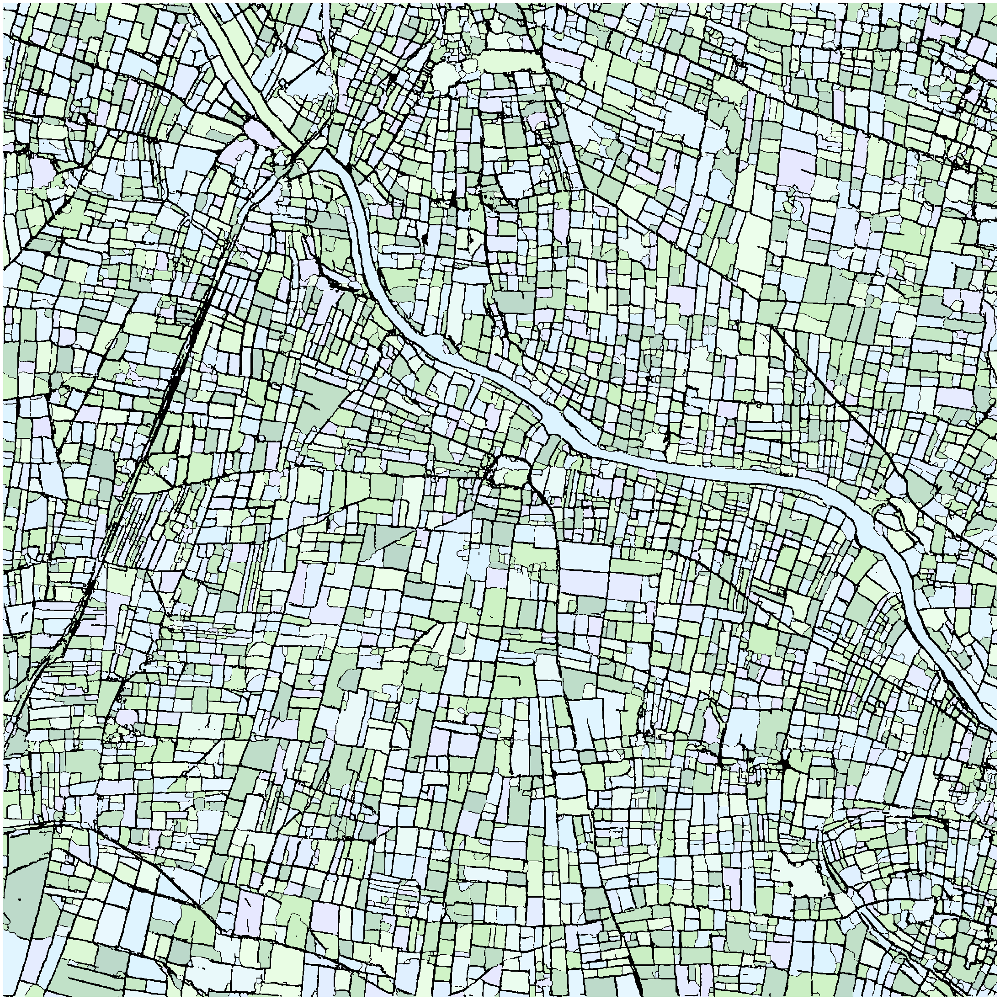

In [132]:
# predicted instance
instances_str = instances.astype(str)
hashall = np.vectorize(hash)
hashed = hashall(instances_str)
instances_hashed = hashed % 1000
new_instances = 0.2 * (deepcopy(instances) > 0)
new_instances = (instances_hashed.astype(float) + 600) / 1600. 
mask = instances > 0
boundary_mask = np.ones((img_size, img_size), dtype=bool)
boundary_mask[:img_size-2,:img_size-2] = ((instances[2:,:] == instances[:-2,:])[:,:img_size-2] 
                                          & (instances[:,2:] == instances[:,:-2])[:img_size-2,:] 
                                          & (instances[2:,2:] == instances[:-2,:-2]) 
                                          & (instances[:-2,2:] == instances[2:,:-2]))

nodes = [0.0, 0.2, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
colors = ['#000000', '#ACC1D1', '#CDF2C4', '#EDFFE9', '#E9F8FF', '#DCF4FF', '#E9EAFF', '#CACAFF']
cmap2 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))

fig, ax = plt.subplots(1, figsize=(40,40))
plt.imshow(new_instances * mask * boundary_mask, cmap=cmap2, vmin=0, vmax=1.1)
plt.axis('off')
plt.show()

## Compute semantic uncertainty score

In [136]:
semantic_scores = []
for (x, y) in points:
    print(instances[x,y])
    if instances[x,y] == 0:
        semantic_scores.append(np.nan)
    else:
        instance_mask = instances != instances[x,y]
        masked_extent = np.ma.array(extent, mask=instance_mask)
        semantic_scores.append(masked_extent.mean())

0
0
2002
5496
2480
4828
0
6376
0
0


In [137]:
semantic_scores

[nan,
 nan,
 0.6696216422067561,
 0.8329494465196793,
 0.8401025898007717,
 0.6602725271451271,
 nan,
 0.8768012517290782,
 nan,
 nan]

## Compute instance uncertainty score

In [133]:
instance_scores = []
for (x, y) in points:
    print(instances[x,y])
    if instances[x,y] == 0:
        instance_scores.append(np.nan)
    else:
        eroded = si.binary_erosion((instances == instances[x,y]))
        border = ((instances * (instances == instances[x,y]) - eroded) > 0) * boundary
        masked_boundary = np.ma.array(border, mask=((instances != instances[x,y]) + (eroded > 0)))
        instance_scores.append(masked_boundary.min())

0
0
2002
5496
2480
4828
0
6376
0
0


In [134]:
instance_scores

[nan,
 nan,
 0.39607844,
 0.8784314,
 0.9019608,
 0.3137255,
 nan,
 0.45490196,
 nan,
 nan]

## Human image interpretation vs. scores

In [138]:
# human inspection of fields where points falls
# True = correct field instance
# False = incorrect field instance
# np.nan = not inside a field
human_img200 = [False, True, True, True, np.nan, True, True, False, True, False]
human_img615 = [False, False, False, False, False, False, False, False, False, True]
human_img849 = [True, np.nan, True, True, np.nan, np.nan, np.nan, np.nan, False, np.nan]
human_img217 = [True, True, False, False, True, True, False, True, np.nan, True]
human_img415 = [True, np.nan, True, True, True, False, True, False, True, True]
human_score = human_img200 + human_img615 + human_img849 + human_img217 + human_img415

# semantic uncertainty scores
semantic_img200 = [0.7777094205860161, 0.8266358667490433, np.nan, 0.876035021820096, np.nan,
                   0.7918430989583334, 0.7762978331875287, np.nan, 0.8380671720984078, 0.8268459037394534]
semantic_img615 = [0.8012713589655918, np.nan, 0.8175163251600366, 0.7574080213916788, 0.8554609794741227,
                   0.7137200050939243, 0.6699680193096188, 0.7821952267562416, np.nan, np.nan]
semantic_img849 = [0.8609600648498814, np.nan, 0.8558946536513257, 0.7666250264869546, np.nan,
                   0.6375750250013423, 0.5902241834598909, 0.6995615721374672, np.nan, 0.7889514026776696]
semantic_img217 = [np.nan, 0.6889328208204877, 0.7839305907531984, 0.5183511082130142, np.nan,
                   0.7296850485879867, 0.684864516242292, np.nan, 0.9136454266104039, np.nan]
semantic_img415 = [np.nan, np.nan, 0.6696216422067561, 0.8329494465196793, 0.8401025898007717,
                   0.6602725271451271, np.nan, 0.8768012517290782, np.nan, np.nan]
semantic_uncertainty = semantic_img200 + semantic_img615 + semantic_img849 + semantic_img217 + semantic_img415

# instance uncertainty scores
instance_img200 = [0.8745098, 0.8627451, np.nan, 0.8862745, np.nan, 
                   0.8666667, 0.8901961, np.nan, 0.9019608, 0.8901961]
instance_img615 = [0.101960786, np.nan, 0.21568628, 0.8901961, 0.36078432,
                   0.92156863, 0.67058825, 0.34901962, np.nan, np.nan]
instance_img849 = [0.8666667, np.nan, 0.8509804, 0.8745098, np.nan,
                   0.38039216, 0.22352941, 0.85490197, np.nan, 0.050980393]
instance_img217 = [np.nan, 0.80784315, 0.7019608, 0.7254902, np.nan,
                   0.8627451, 0.4627451, np.nan, 0.21176471, np.nan]
instance_img415 = [np.nan, np.nan, 0.39607844, 0.8784314, 0.9019608,
                   0.3137255, np.nan, 0.45490196, np.nan, np.nan]
instance_uncertainty = instance_img200 + instance_img615 + instance_img849 + instance_img217 + instance_img415


uncertainty_df = pd.DataFrame({
    'human_score': human_score,
    'semantic_uncertainty': semantic_uncertainty,
    'instance_uncertainty': instance_uncertainty
})

In [141]:
uncertainty_clean = uncertainty_df.dropna().reset_index(drop=True)

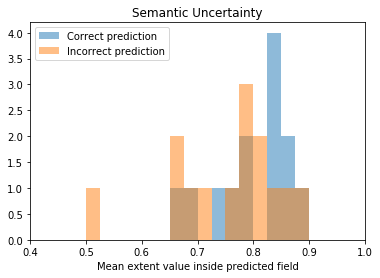

In [154]:
plt.hist(uncertainty_clean[uncertainty_clean['human_score']]['semantic_uncertainty'], 
         bins=np.linspace(0, 1, 41), alpha=0.5)
plt.hist(uncertainty_clean[uncertainty_clean['human_score'] == False]['semantic_uncertainty'], 
         bins=np.linspace(0, 1, 41), alpha=0.5)
plt.xlim([0.4, 1])
plt.xlabel('Mean extent value inside predicted field')
plt.legend(['Correct prediction', 'Incorrect prediction'])
plt.title('Semantic Uncertainty')
plt.show()

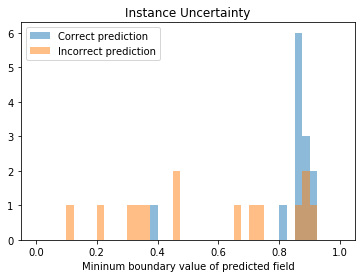

In [156]:
plt.hist(uncertainty_clean[uncertainty_clean['human_score']]['instance_uncertainty'], 
         bins=np.linspace(0, 1, 41), alpha=0.5)
plt.hist(uncertainty_clean[uncertainty_clean['human_score'] == False]['instance_uncertainty'], 
         bins=np.linspace(0, 1, 41), alpha=0.5)
# plt.xlim([0.4, 1])
plt.xlabel('Mininum boundary value of predicted field')
plt.legend(['Correct prediction', 'Incorrect prediction'])
plt.title('Instance Uncertainty')
plt.show()

In [140]:
uncertainty_df.groupby('human_score').size()

human_score
False    18
True     23
dtype: int64